#  **MISP Project** - Image Deconvolution with Tikhonov Regularization

This notebook was made by:
- Matteo Caviglia
- Sofia Gaia Formenti

### **Pipeline**

1.   Generate the blur kernel (PSF)
  -   Gaussian
  -   Motion blur
  - Out of focus blur
  - Diffraction-limited blur
2.   Convolve image with PSF
3.   Transform to Fourier domain
4.   Apply regularized deconvolution
  - Tikhonov
  - Sobolev
5.   Apply IFT and obtain the reconstructed image
6.   Quality metric computation (PSNR) and result visualization



## 1 - Main Functions definition

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
import cv2
import seaborn as sns
from scipy.special import j1

######################################
# PSNR Function
######################################

def psnr(img1, img2):
    """
    Compute the PSNR (Peak Signal-to-Noise Ratio) between img1 and img2.
    Assumes images are either in range [0,1] or [0,255].
    """
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return 100.0  # ideal case
    # Determine max pixel intensity
    max_val = 1.0 if img1.max() <= 1 else 255.0
    return 20 * np.log10(max_val / np.sqrt(mse))

######################################
# Kernel Generators
######################################

def gaussian_kernel(size, sigma):
    """
    Generate a 2D Gaussian kernel of given size and standard deviation (sigma).

    Parameters:
    - size: int, the total width and height of the kernel
    - sigma: float, standard deviation for the Gaussian
    """
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2.0 * sigma**2))
    kernel /= np.sum(kernel)
    return kernel


def motion_blur_kernel(length, angle=0):
    """
    Generate a simple motion blur kernel of given length and angle.
    For simplicity, the angle is not applied here (no rotation).
    If you'd like a real rotated kernel, consider rotating the 'ones' row or
    using a transformation matrix.

    Parameters:
    - length: int, the size of the kernel (square)
    - angle: float, angle of motion in degrees or radians (not used by default)
    """
    kernel = np.zeros((length, length), dtype=np.float32)
    kernel[length // 2, :] = 1.0
    kernel /= kernel.sum()
    return kernel


def out_of_focus_kernel(size, radius):
    """
    Approximate an out-of-focus (disk) blur kernel by creating a disk
    of given radius within a square 'size x size'.

    Parameters:
    - size: int, the kernel width/height
    - radius: float, radius of the disk
    """
    # Create coordinate grid
    ax = np.linspace(-(size - 1) / 2, (size - 1) / 2, size)
    xx, yy = np.meshgrid(ax, ax)
    rr = np.sqrt(xx**2 + yy**2)

    # Binary mask for a disk of 'radius'
    disk = (rr <= radius).astype(float)

    # Normalize
    disk /= disk.sum()
    return disk


def diffraction_limited_kernel(size, alpha=2.0):
    """
    Diffraction-limited blur (Airy disk) using Bessel functions.
    The kernel is generated in the spatial domain, normalized at the end.

    Parameters:
    - size: int, the kernel width/height
    - alpha: float, controlling the scale of the Airy disk (half angle of light cone)

    The standard form of an Airy disk in 2D is:
      (2 * J1(alpha * r) / (alpha * r))^2
    where r is the radial distance from the center.
    """
    center = (size - 1) / 2.0
    kernel = np.zeros((size, size), dtype=np.float32)

    for i in range(size):
        for j in range(size):
            # radial distance from center
            r = np.sqrt((i - center)**2 + (j - center)**2)
            # avoid division by zero with a small epsilon
            r = max(r, 1e-9)

            val = (2.0 * j1(alpha * r) / (alpha * r))**2
            kernel[i, j] = val

    # Normalize kernel
    kernel /= kernel.sum()
    return kernel

######################################
# Dictionaries of Kernel Generators
######################################

kernel_generators = {
    'gaussian': gaussian_kernel,
    'motion': motion_blur_kernel,
    'out_of_focus': out_of_focus_kernel,
    'diffraction': diffraction_limited_kernel,
}

kernel_required_params = {
    'gaussian': {'size', 'sigma'},
    'motion': {'length', 'angle'},
    'out_of_focus': {'size', 'radius'},
    'diffraction': {'size', 'alpha'},
}

######################################
# Blurring Function
######################################

def blur_image(image, kernel_type='gaussian', kernel_params=None, boundary='wrap', var=0.01, return_kernel=False):
    """
    Blurs an image using one of the four kernel types:
      - 'gaussian'
      - 'motion'
      - 'out_of_focus'
      - 'diffraction'

    The appropriate kernel is selected using `kernel_generators`.
    After the kernel is generated, `convolve2d` is used to produce
    the blurred output.

    Parameters:
    - image: 2D NumPy array (grayscale image)
    - kernel_type: str, type of kernel to use (keys from kernel_generators)
    - kernel_params: dict, parameters needed for the chosen kernel
    - boundary: str, boundary mode for convolve2d ('wrap', 'symm', etc.)
    - var: float, variance for the noise (default: 0.01)
    - return_kernel: bool, whether to return the chosen kernel or not

    Returns:
    - blurred: 2D NumPy array, the blurred image
    """

    if kernel_type not in kernel_generators:
        raise ValueError(f"Unknown kernel_type '{kernel_type}'. Choose from {list(kernel_generators.keys())}.")

    if kernel_params is None:
        kernel_params = {}

    required_params = kernel_required_params[kernel_type]
    missing_params = required_params - set(kernel_params.keys())
    if missing_params:
        raise ValueError(
            f"Missing required parameters {missing_params} for kernel '{kernel_type}'. "
            f"Must provide: {required_params}"
        )

    # Generate the chosen kernel
    kernel = kernel_generators[kernel_type](**kernel_params)

    # Perform 2D convolution
    blurred = convolve2d(image, kernel, mode='same', boundary=boundary)   # 'same' := output size is the same as input
    noise = np.random.normal(0, var, blurred.shape)
    blurred = blurred + noise
    if return_kernel:
        return blurred, kernel
    else:
        return blurred

######################################
# Deconvolution Functions
######################################

def deconvolve_L2(g, kernel, mu):
    """
    Perform L2-regularized deconvolution in the Fourier domain.

    Minimizes ||Af - g||^2 + mu * ||f||^2,
    where A is convolution by `kernel`.

    Parameters:
    - g: blurred & noisy image (2D np.array)
    - kernel: blur kernel (2D np.array)
    - mu: regularization parameter

    Returns:
    - f_recon: reconstructed image
    """
    G = np.fft.fft2(g)
    K = np.fft.fft2(kernel, s=g.shape)
    denom = (np.abs(K)**2 + mu)
    numerator = np.conjugate(K) * G
    F_hat = numerator / denom
    f_recon = np.fft.ifft2(F_hat).real
    return f_recon


def deconvolve_H1(g, kernel, mu):
    """
    Perform H1-regularized deconvolution in the Fourier domain.

    Minimizes ||Af - g||^2 + mu * (||f||^2 + ||grad f||^2).

    Parameters:
    - g: blurred & noisy image (2D np.array)
    - kernel: blur kernel (2D np.array)
    - mu: regularization parameter

    Returns:
    - f_recon: reconstructed image
    """
    M, N = g.shape
    G = np.fft.fft2(g)
    K = np.fft.fft2(kernel, s=g.shape)
    omega_1 = 2.0 * np.pi * np.fft.fftfreq(M)
    omega_2 = 2.0 * np.pi * np.fft.fftfreq(N)
    w2, w1 = np.meshgrid(omega_2, omega_1)
    denom = np.abs(K)**2 + mu * (1.0 + w1**2 + w2**2)
    numerator = np.conjugate(K) * G
    F_hat = numerator / denom
    f_recon = np.fft.ifft2(F_hat).real
    return f_recon

######################################
# Generic Reconstruction Functions
######################################

def reconstruct_image(
    original,
    kernel_type='gaussian',
    kernel_params={'size': 10, 'sigma': 0.5},
    mu=1e-3,
    method='L2',
    boundary='wrap',
    return_plot=True
    ):
    """
    Generate a reconstructed image given:
      - an original image
      - a chosen kernel type (e.g. 'gaussian', 'motion') + kernel_params
      - a regularization parameter mu
      - a regularization method ('L2' or 'H1')

    This function:
      1) generates the specified blur kernel
      2) blurs the original image
      3) adds noise
      4) performs the chosen deconvolution (L2 or H1)
      5) computes and prints PSNR
    """
    # 1) Blur Image and Retrieve Kernel
    g, kernel = blur_image(original, kernel_type, kernel_params, boundary, return_kernel=True)

    # 2) Deconvolution
    if method.upper() == 'L2':
        f_recon = deconvolve_L2(g, kernel, mu)
    elif method.upper() == 'H1':
        f_recon = deconvolve_H1(g, kernel, mu)
    else:
        raise ValueError(f"Unknown method '{method}'. Use 'L2' or 'H1'.")

    # 3) Compute PSNR
    current_psnr = psnr(f_recon, original)

    # 4) Plot and Show Results
    if return_plot: plot_single_result(g, f_recon, current_psnr, kernel_type, method, mu)

    return f_recon, current_psnr

######################################
# Visualization Functions
######################################

def plot_single_result(
    blurred,
    reconstruction,
    psnr_value,
    kernel_type,
    method,
    mu,
    figsize=(12, 6),
    cmap="gray"
):
    """
    Plot a single reconstruction alongside the original image and display the PSNR.

    Parameters:
    - blurred: 2D NumPy array (the blurred image we are trying to reconstruct)
    - reconstruction: 2D NumPy array (the reconstructed image)
    - psnr_value: float, PSNR value
    - kernel_type: string indicating the blur kernel used (e.g., 'gaussian')
    - method: string indicating the method name ("L2" or "H1")
    - mu: float, the regularization parameter used
    - figsize: tuple, size of the figure
    - cmap: string, colormap to use for imshow

    This function uses Seaborn to provide a slightly improved aesthetic.
    """
    # Use a Seaborn style for aesthetics
    sns.set_style("whitegrid")

    # Create a figure with two axes side by side
    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # Plot the original image on the left
    axes[0].imshow(blurred, cmap=cmap)
    axes[0].set_title("Blurred Image", fontsize=14)
    axes[0].axis("off")

    # Plot the reconstructed image on the right
    title_str = (
        f"Reconstruction\n"
        f"Kernel: {kernel_type}\n"
        f"Method: {method}, mu={mu}\n"
        f"PSNR: {psnr_value:.2f} dB"
    )
    axes[1].imshow(reconstruction, cmap=cmap)
    axes[1].set_title(title_str, fontsize=14)
    axes[1].axis("off")

    # Adjust spacing around subplots to prevent overlapping text
    plt.tight_layout()
    plt.show()


def plot_psnr(mus, psnr_values, comment):
    if len(mus) != len(psnr_values):
        raise ValueError("Input lists must have the same length.")
    plt.figure(figsize=(8, 5))
    plt.plot(mus, psnr_values, marker='o')
    plt.xscale('log')
    plt.xlabel('Regularization Parameter (mu)')
    plt.ylabel('PSNR (dB)')
    plt.title(f'PSNR vs. Regularization Parameter\n({comment})')
    plt.grid(True)
    plt.show()

## 2 - Image

In [ ]:
import urllib.request

url = "https://github.com/22cav/MISP_Project/blob/main/Pinguino%20Matematico.jpg?raw=true"
urllib.request.urlretrieve(url, "Pinguino Matematico.jpg")
print("Download complete!")

Download complete!


In [ ]:
original = cv2.imread('Pinguino Matematico.jpg', cv2.IMREAD_GRAYSCALE)

 # Convert to float32 in [0,1]
original = original.astype(np.float32)
if original.max() > 1:
    original /= 255.0

## 3 - Examples

### 3.1 - Different blurring methods

In [ ]:
def blur_example():
    global original

    # 1) Gaussian Blur (requires: size, sigma)
    blurred_gauss = blur_image(
        original,
        kernel_type='gaussian',
        kernel_params={'size': 15, 'sigma': 3}
    )

    # 2) Motion Blur (requires: length, angle)
    blurred_motion = blur_image(
        original,
        kernel_type='motion',
        kernel_params={'length': 15, 'angle': 0}
    )

    # 3) Out-of-Focus (requires: size, radius)
    blurred_oof = blur_image(
        original,
        kernel_type='out_of_focus',
        kernel_params={'size': 15, 'radius': 8}
    )

    # 4) Diffraction-Limited (requires: size, alpha)
    blurred_diff = blur_image(
        original,
        kernel_type='diffraction',
        kernel_params={'size': 10, 'alpha': 0.5}
    )

    # Plot and compare
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title('Original')
    axes[0].axis('off')

    axes[1].imshow(blurred_gauss, cmap='gray')
    axes[1].set_title('Gaussian Blur')
    axes[1].axis('off')

    axes[2].imshow(blurred_motion, cmap='gray')
    axes[2].set_title('Motion Blur')
    axes[2].axis('off')

    axes[3].imshow(blurred_oof, cmap='gray')
    axes[3].set_title('Out-of-Focus')
    axes[3].axis('off')

    axes[4].imshow(blurred_diff, cmap='gray')
    axes[4].set_title('Diffraction-Limited')
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()

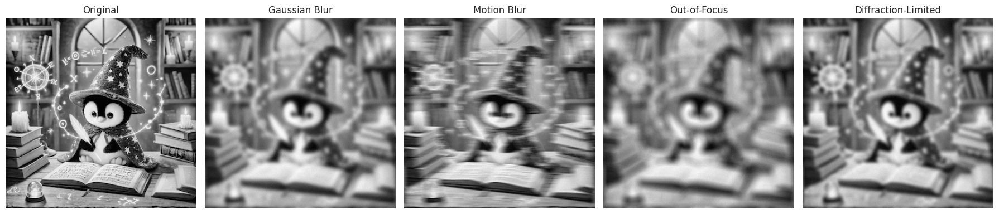

In [ ]:
blur_example()

### 3.2 - L2 Reconstruction with different µ

In [ ]:
def reconstruct_example():
    global original

    mu_values = [10, 1, 0.1, 0.01, 0.001, 0.0001, 0.00001]
    psnr_collection = []
    for i, mu in enumerate(mu_values):
        _, psnr = reconstruct_image(
            original,
            kernel_type='gaussian',
            kernel_params={'size': 15, 'sigma': 3},
            mu=mu,
            method='L2'
        )
        psnr_collection.append(psnr)
    plot_psnr(mu_values, psnr_collection, 'Gaussian Blur')


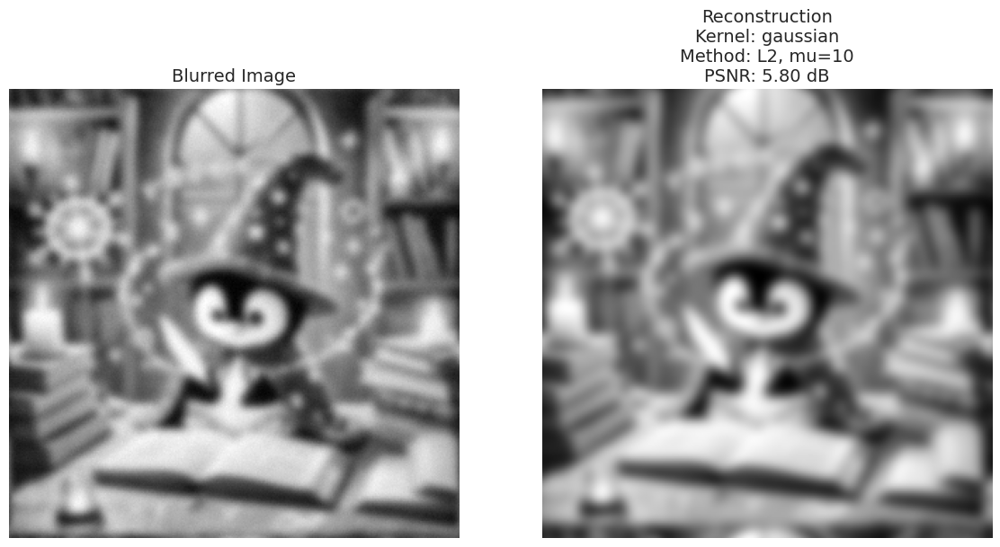

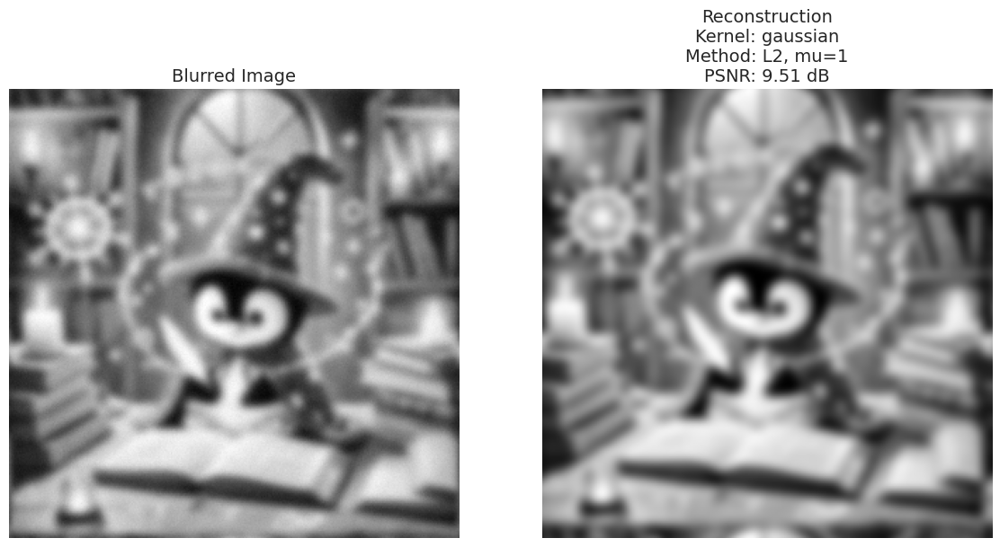

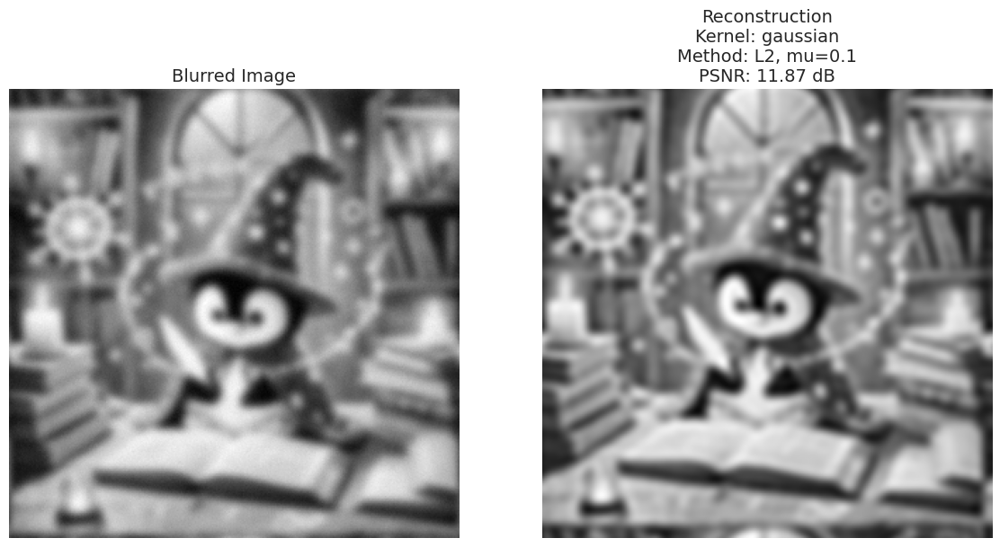

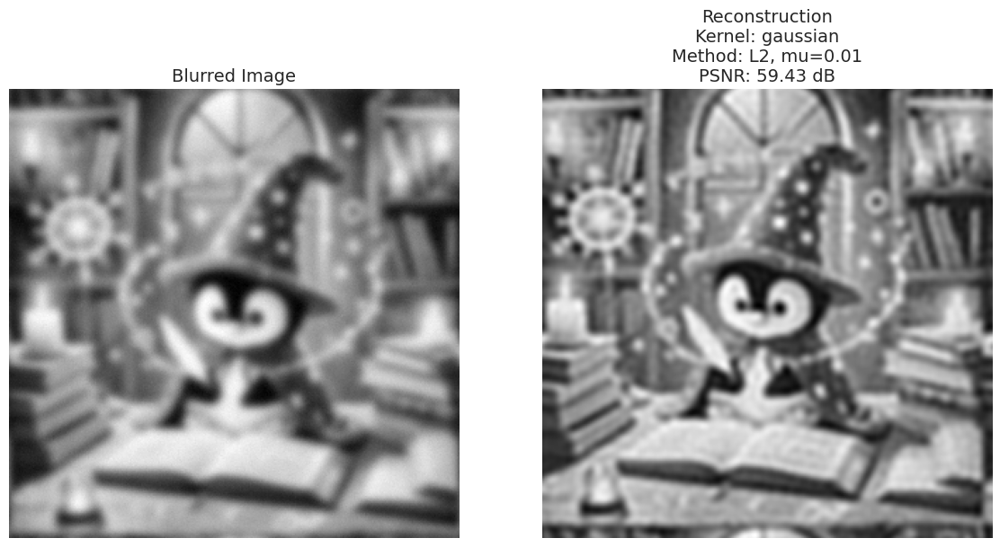

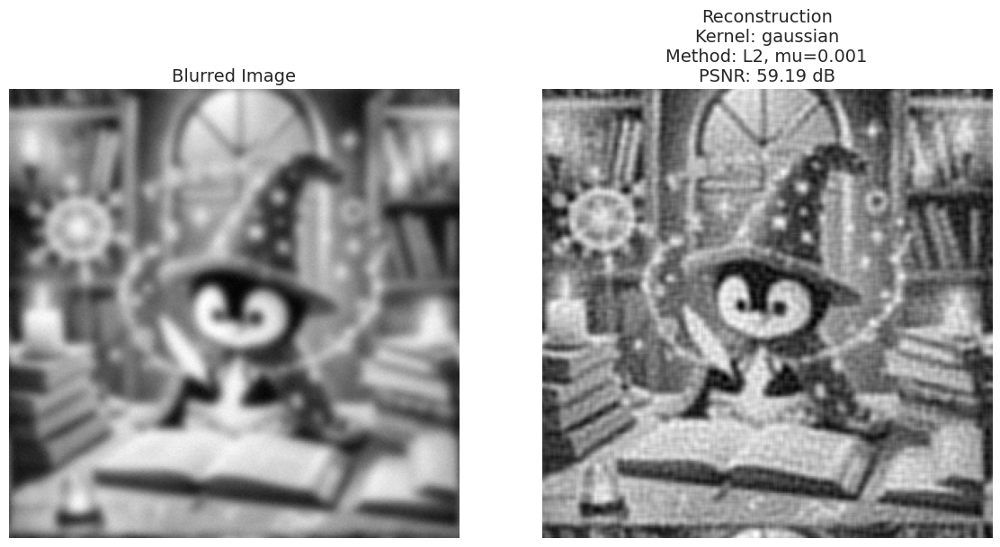

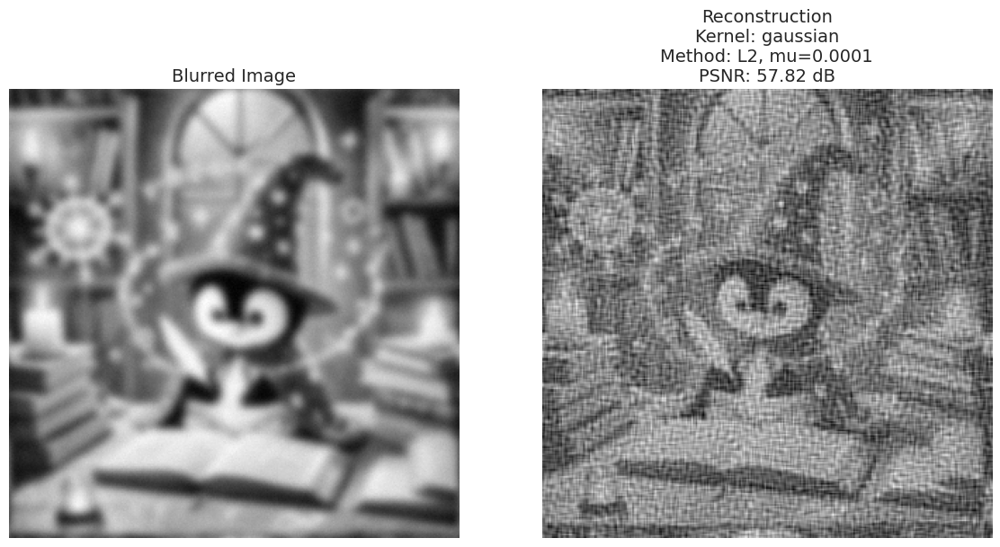

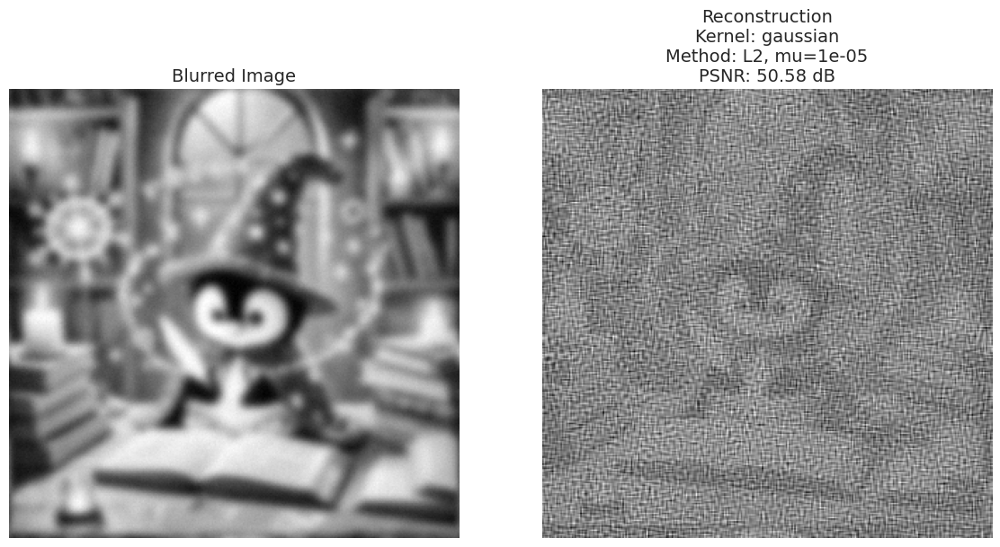

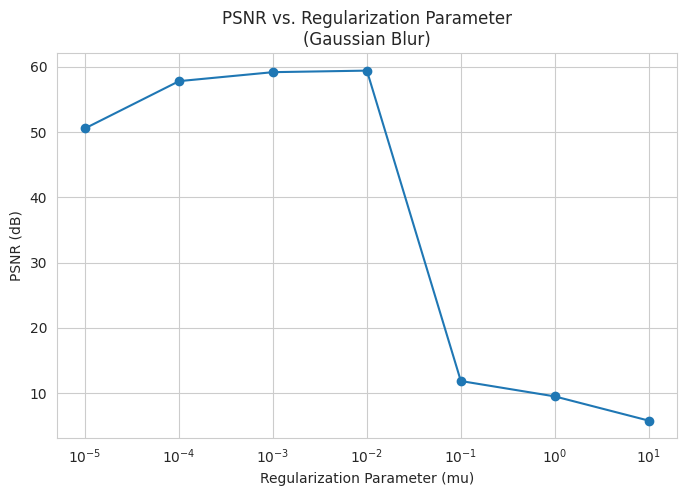

In [ ]:
reconstruct_example()

### 3.3 - Reconstruction comparison between L2 and H1 methods

In [ ]:
def different_deconvolution_example():
    global original

    size = 15
    sigma = 3
    mu_values = [1, 0.1, 0.01, 0.001, 0.0001, 0.00001]
    psnr_collection_l2 = []
    psnr_collection_h1 = []

    img_collection_l2 = []
    img_collection_h1 = []

    for i, mu in enumerate(mu_values):
        img_l2, psnr_l2 = reconstruct_image(
            original,
            kernel_type='gaussian',
            kernel_params={'size': size, 'sigma': sigma},
            mu=mu,
            method='L2',
            return_plot=False
        )
        img_h1, psnr_h1 = reconstruct_image(
            original,
            kernel_type='gaussian',
            kernel_params={'size': size, 'sigma': sigma},
            mu=mu,
            method='H1',
            return_plot=False
        )
        psnr_collection_l2.append(psnr_l2)
        psnr_collection_h1.append(psnr_h1)
        img_collection_l2.append(img_l2)
        img_collection_h1.append(img_h1)

    blurred = blur_image(
        original,
        kernel_type='gaussian',
        kernel_params={'size': size, 'sigma': sigma}
    )

    num_rows = len(mu_values) + 1
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 4 * num_rows))

    axes[0, 0].imshow(original, cmap='gray')
    axes[0, 0].set_title('Original', fontsize=12)
    axes[0, 0].axis('off')
    axes[0, 1].imshow(blurred, cmap='gray')
    axes[0, 1].set_title('Blurred Image', fontsize=12)
    axes[0, 1].axis('off')
    axes[0, 2].axis('off')

    for i, mu in enumerate(mu_values, start=1):
        # The row index in the axes is i (since row 0 was the top row)
        row_axes = axes[i]

        l2_img = img_collection_l2[i - 1]
        h1_img = img_collection_h1[i - 1]
        diff_img = np.abs(l2_img - h1_img)

        # L2
        row_axes[0].imshow(l2_img, cmap='gray')
        row_axes[0].set_title(
            f'L2 (mu={mu})\nPSNR={psnr_collection_l2[i - 1]:.2f}', fontsize=12
        )
        row_axes[0].axis('off')

        # H1
        row_axes[1].imshow(h1_img, cmap='gray')
        row_axes[1].set_title(
            f'H1 (mu={mu})\nPSNR={psnr_collection_h1[i - 1]:.2f}', fontsize=12
        )
        row_axes[1].axis('off')

        # Difference
        row_axes[2].imshow(diff_img, cmap='gray')
        row_axes[2].set_title('|L2 - H1|', fontsize=12)
        row_axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    plot_psnr(mu_values, psnr_collection_l2, "L2 Deconvolution")
    plot_psnr(mu_values, psnr_collection_h1, "H1 Deconvolution")

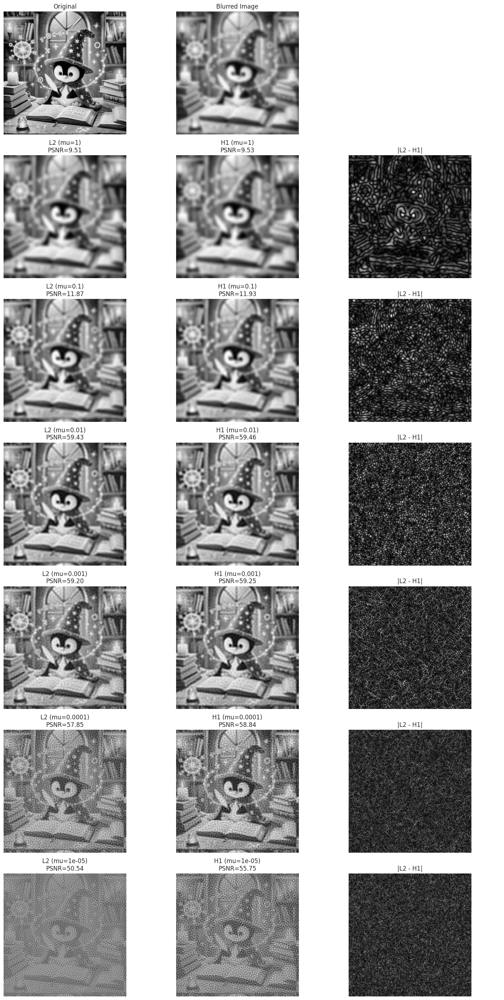

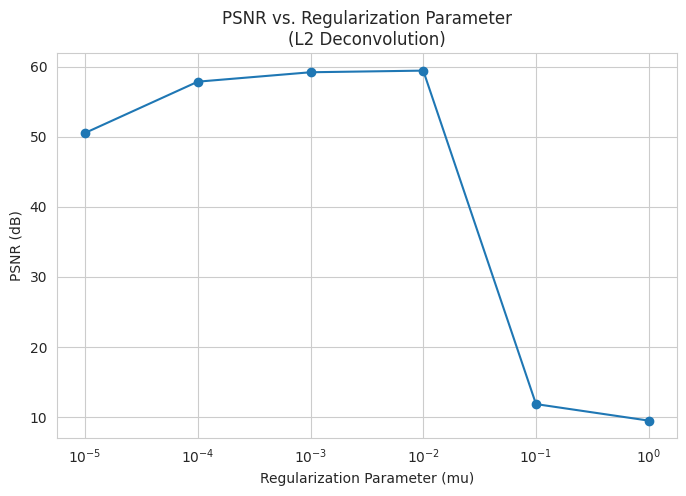

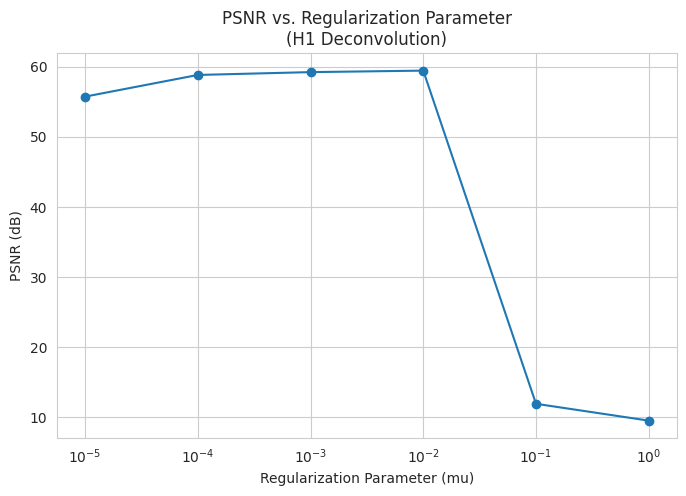

In [ ]:
different_deconvolution_example()

### 3.4 - L2 Deconvolution with differently blurred images

In [ ]:
def different_kernel_reconstruction_example():
    global original

    kernel_types = ['gaussian', 'motion', 'out_of_focus', 'diffraction']
    kernel_params = [
        {'size': 15, 'sigma': 3},
        {'length': 15, 'angle': 0},
        {'size': 15, 'radius': 8},
        {'size': 20, 'alpha': 0.1},
    ]
    mu = 0.001
    psnr_collection = []
    for i, kernel_type in enumerate(kernel_types):
        _, psnr = reconstruct_image(
            original,
            kernel_type=kernel_type,
            kernel_params=kernel_params[i],
            mu=mu,
            method='L2'
        )
        psnr_collection.append(psnr)

    plt.bar(kernel_types, psnr_collection)
    plt.yscale('log')
    plt.xlabel('Kernel Type')
    plt.ylabel('PSNR (dB)')
    plt.title('PSNR vs. Kernel Type')
    plt.show()

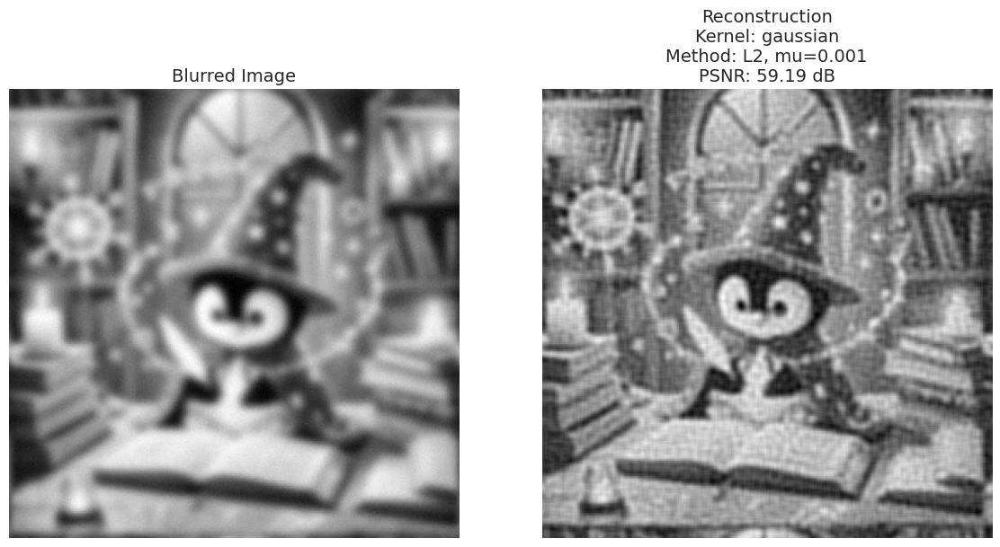

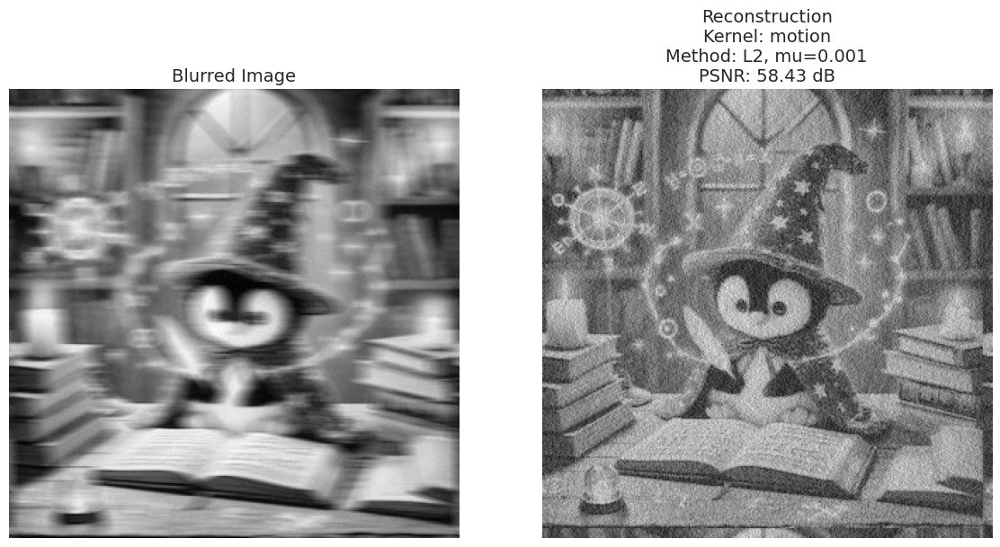

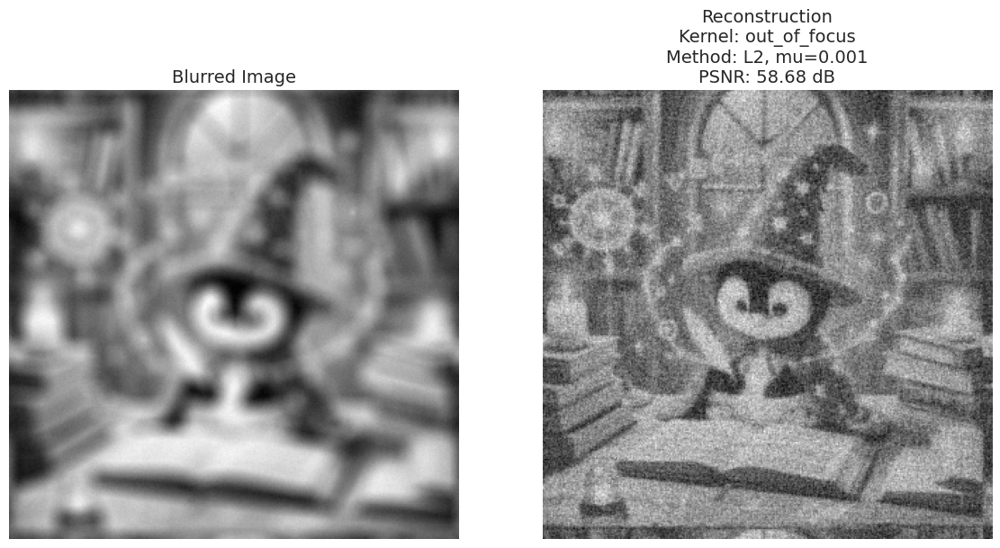

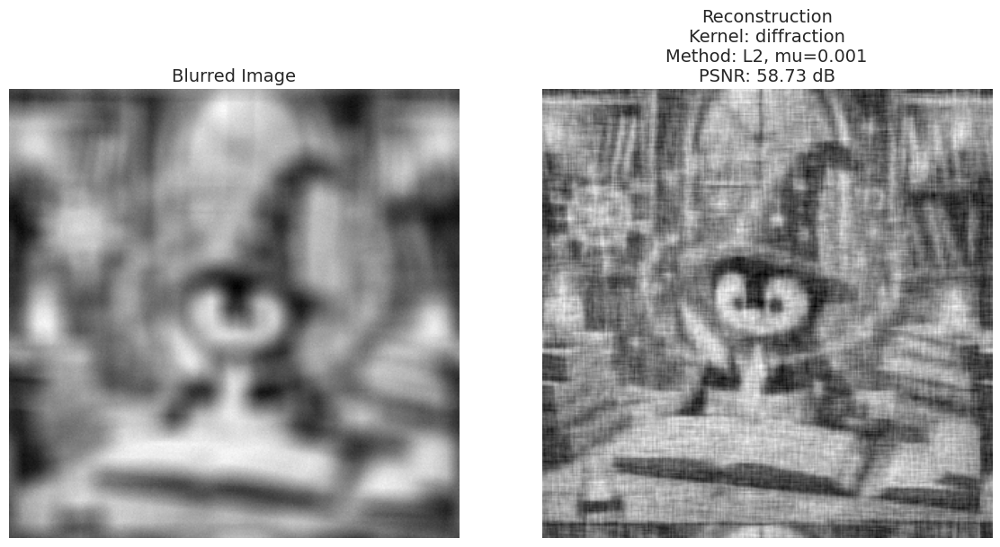

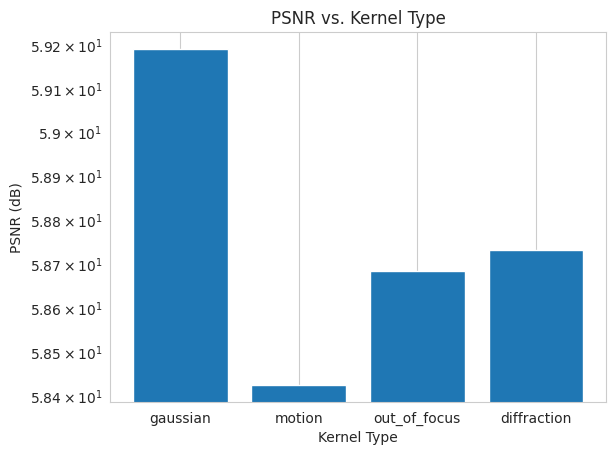

In [ ]:
different_kernel_reconstruction_example()

## 4 - Window Functions (EXTRA)

In [ ]:
######################################
# Window Generators
######################################

def rectangular_window(shape):
    return np.ones(shape)

def triangular_window(shape):           # zero at the edges
    bartlett_y = np.bartlett(shape[0])
    bartlett_x = np.bartlett(shape[1])
    return np.outer(bartlett_y, bartlett_x)

def hamming_window(shape):              # tapering at edges
    hamming_y = np.hamming(shape[0])
    hamming_x = np.hamming(shape[1])
    return np.outer(hamming_y, hamming_x)

def gaussian_window(shape, sigma):
    rows, cols = shape
    y = np.linspace(-rows/2, rows/2, rows)
    x = np.linspace(-cols/2, cols/2, cols)
    xx, yy = np.meshgrid(x, y)
    rr = np.sqrt(xx**2 + yy**2)
    window = np.exp(-(rr**2)/(2 * sigma**2))
    window /= window.max()
    return window

def butterworth_window(shape, cutoff, order=2):
    rows, cols = shape
    y = np.linspace(-rows/2, rows/2, rows)
    x = np.linspace(-cols/2, cols/2, cols)
    xx, yy = np.meshgrid(x, y)
    rr = np.sqrt(xx**2 + yy**2)
    window = 1.0 / (1 + (rr / cutoff) ** (2 * order))
    return window

window_generators = {
    'rectangular': rectangular_window,
    'triangular': triangular_window,
    'hamming': hamming_window,
    'gaussian': gaussian_window,
    'butterworth': butterworth_window,
}

window_required_params = {
    'rectangular': set(),
    'triangular': set(),
    'hamming': set(),
    'gaussian': {'sigma'},
    'butterworth': {'cutoff', 'order'},
}


######################################
# Reconstruction Function with Window Support
######################################

def reconstruct_image(
    original,
    kernel_type='gaussian',
    kernel_params={'size': 10, 'sigma': 0.5},
    mu=1e-3,
    method='L2',
    boundary='wrap',
    return_plot=True,
    window_type=None,
    window_params=None
):
    # Blur the image and retrieve the kernel
    g, kernel = blur_image(original, kernel_type, kernel_params, boundary, return_kernel=True)

    # Apply window if specified
    if window_type is not None:
        if window_type not in window_generators:
            raise ValueError(f"Unknown window_type '{window_type}'.")
        if window_params is None:
            window_params = {}
        required = window_required_params[window_type]
        missing = required - set(window_params.keys())
        if missing:
            raise ValueError(f"Missing parameters {missing} for window '{window_type}'.")
        window = window_generators[window_type](original.shape, **window_params)
        g = g * window  # Apply the window to the blurred image

    # Perform deconvolution
    if method.upper() == 'L2':
        f_recon = deconvolve_L2(g, kernel, mu)
    elif method.upper() == 'H1':
        f_recon = deconvolve_H1(g, kernel, mu)
    else:
        raise ValueError(f"Unknown method '{method}'. Use 'L2' or 'H1'.")

    # Compute PSNR
    current_psnr = psnr(f_recon, original)

    # Plot results
    if return_plot:
        plot_single_result(g, f_recon, current_psnr, kernel_type, method, mu)

    return f_recon, current_psnr

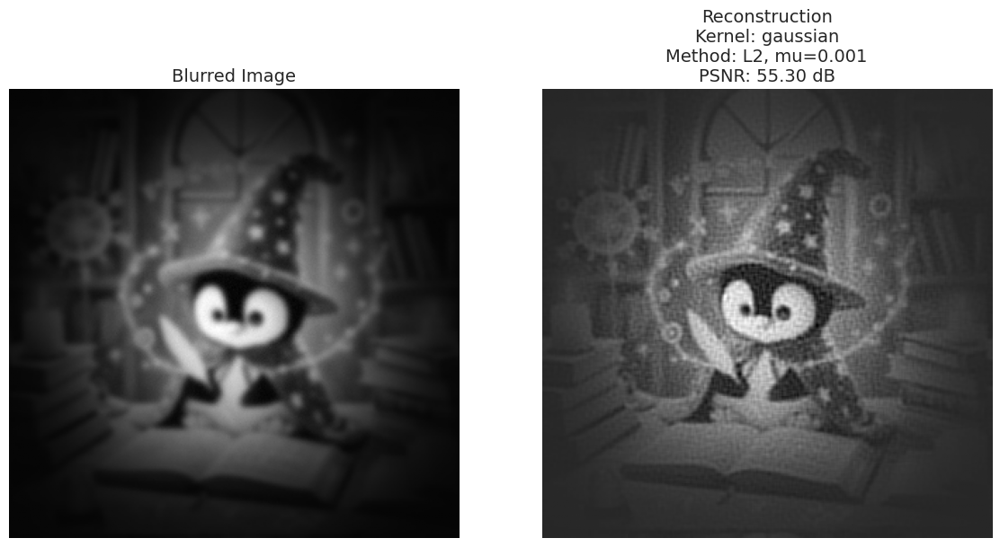

In [ ]:
# Reconstruct with a hamming window
f_recon, psnr_value = reconstruct_image(
    original,
    kernel_type='gaussian',
    kernel_params={'size': 10, 'sigma': 2},
    mu=1e-3,
    method='L2',
    window_type='hamming',
    return_plot=True
)